# View HD160617_HD185975_HD205905
==================================================================================================

Ronde des étoiles

- author : Sylvie Dagoret-Campagne
- date   : 4 juillet 2017


Analysis of star HD160617_HD185975_HD205905 Night 10 June 2017 at CTIO.
- Bougher line with RG175 and FB



In [2]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np

from astropy.modeling import models
from astropy import units as u
from astropy import nddata
from astropy.io import fits
import re
import os
from matplotlib.colors import LogNorm

In [3]:
from scipy import stats  
from scipy import ndimage
from datetime import datetime, timedelta
from mpl_toolkits.mplot3d import Axes3D
import scipy.signal

In [4]:
import matplotlib
matplotlib.rc('xtick', labelsize=20) 
matplotlib.rc('ytick', labelsize=20) 

In [5]:
# to enlarge the sizes
params = {'legend.fontsize': 'x-large',
          'figure.figsize': (8, 8),
         'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'x-large',
         'ytick.labelsize':'x-large'}
plt.rcParams.update(params)

In [6]:
############################################################################
def ensure_dir(f):
    d = os.path.dirname(f)
    if not os.path.exists(f):
        os.makedirs(f)
#########################################################################

In [7]:
outputdir="processed_fitsimages"
ensure_dir(outputdir)

## Location of corrected images
----------------------------------

In [8]:
!pwd

/Users/dagoret-campagnesylvie/MacOsX/LSST/MyWork/GitHub/CTIOAnaJun2017/ana_10jun17/HD160617_HD185975_HD205905


### User must fill its info below

In [9]:
rootpath_rawimage="../OverScanRemove/trim_images"
MIN_IMGNUMBER=135
MAX_IMGNUMBER=303
object_name='HD160617_HD185975_HD205905 June 10th'
SelectTagRe='^trim_20170610_([0-9]+).fits$' # regular expression to select the file
SearchTagRe='^trim_20170610_[0-9]+.fits$'
NBIMGPERLROW=4

In [10]:
#dirlist_all=os.listdir(rootpath_rawimage) 

In [11]:
#if '.DS_Store' in dirlist_all:
#    dirlist_all.remove('.DS_Store')
dirlist=[]
dirlist.append(rootpath_rawimage)
dirlist_all=np.array(dirlist)

In [12]:
print dirlist_all

['../OverScanRemove/trim_images']


In [13]:
indexes_files= [] # global list
filelist_fitsimages= []  # global list

In [14]:
def MakeFileList():
    """
    MakeFileList : Make The List of files to open
    =============
    
    - we select the files which are of interest.
    - In particular select the number range
    
    """
    count=0
    
    for dir in dirlist_all: # loop on directories, one per image   (if necessary)    
            dir_leaf= dir # build the name of leaf directory
            listfiles=os.listdir(dir_leaf) 
            for filename in listfiles:
                if re.search(SearchTagRe,filename):  #example of filename filter
                    str_index=re.findall(SelectTagRe,filename)
                    count=count+1
                    index=int(str_index[0])
                    if index >= MIN_IMGNUMBER and index <= MAX_IMGNUMBER: 
                        indexes_files.append(index)         
                        shortfilename=dir_leaf+'/'+filename
                        filelist_fitsimages.append(shortfilename)
                    
    return

In [15]:
MakeFileList()   # Make the list

In [16]:
indexes_files=np.array(indexes_files)
filelist_fitsimages=np.array(filelist_fitsimages)

In [17]:
print len(indexes_files)

169


In [18]:
print len(filelist_fitsimages)

169


In [19]:
print indexes_files

[135 136 137 138 139 140 141 142 143 144 145 146 147 148 149 150 151 152
 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170
 171 172 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188
 189 190 191 192 193 194 195 196 197 198 199 200 201 202 203 204 205 206
 207 208 209 210 211 212 213 214 215 216 217 218 219 220 221 222 223 224
 225 226 227 228 229 230 231 232 233 234 235 236 237 238 239 240 241 242
 243 244 245 246 247 248 249 250 251 252 253 254 255 256 257 258 259 260
 261 262 263 264 265 266 267 268 269 270 271 272 273 274 275 276 277 278
 279 280 281 282 283 284 285 286 287 288 289 290 291 292 293 294 295 296
 297 298 299 300 301 302 303]


In [20]:
len(indexes_files)

169

In [21]:
filelist_fitsimages

array(['../OverScanRemove/trim_images/trim_20170610_135.fits',
       '../OverScanRemove/trim_images/trim_20170610_136.fits',
       '../OverScanRemove/trim_images/trim_20170610_137.fits',
       '../OverScanRemove/trim_images/trim_20170610_138.fits',
       '../OverScanRemove/trim_images/trim_20170610_139.fits',
       '../OverScanRemove/trim_images/trim_20170610_140.fits',
       '../OverScanRemove/trim_images/trim_20170610_141.fits',
       '../OverScanRemove/trim_images/trim_20170610_142.fits',
       '../OverScanRemove/trim_images/trim_20170610_143.fits',
       '../OverScanRemove/trim_images/trim_20170610_144.fits',
       '../OverScanRemove/trim_images/trim_20170610_145.fits',
       '../OverScanRemove/trim_images/trim_20170610_146.fits',
       '../OverScanRemove/trim_images/trim_20170610_147.fits',
       '../OverScanRemove/trim_images/trim_20170610_148.fits',
       '../OverScanRemove/trim_images/trim_20170610_149.fits',
       '../OverScanRemove/trim_images/trim_20170610_150

In [22]:
len(filelist_fitsimages)

169

In [23]:
#sorted_dates=np.argsort(filelist_fitsimages)

In [24]:
sorted_indexes=np.argsort(indexes_files) # sort the file indexes

In [25]:
sorted_indexes

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168])

In [26]:
#print sorted_dates

In [27]:
print sorted_indexes

[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168]


In [28]:
#sorted_files= [filelist_fitsimages[index] for index in sorted_indexes] # sort files
sorted_files=filelist_fitsimages[sorted_indexes]

In [29]:
#sorted_numbers= [indexes_files[index] for index in sorted_indexes]
sorted_numbers=indexes_files[sorted_indexes]

In [30]:
sorted_numbers

array([135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147,
       148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160,
       161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173,
       174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186,
       187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199,
       200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212,
       213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225,
       226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238,
       239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251,
       252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 262, 263, 264,
       265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277,
       278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290,
       291, 292, 293, 294, 295, 296, 297, 298, 299, 300, 301, 302, 303])

In [31]:
sorted_files

array(['../OverScanRemove/trim_images/trim_20170610_135.fits',
       '../OverScanRemove/trim_images/trim_20170610_136.fits',
       '../OverScanRemove/trim_images/trim_20170610_137.fits',
       '../OverScanRemove/trim_images/trim_20170610_138.fits',
       '../OverScanRemove/trim_images/trim_20170610_139.fits',
       '../OverScanRemove/trim_images/trim_20170610_140.fits',
       '../OverScanRemove/trim_images/trim_20170610_141.fits',
       '../OverScanRemove/trim_images/trim_20170610_142.fits',
       '../OverScanRemove/trim_images/trim_20170610_143.fits',
       '../OverScanRemove/trim_images/trim_20170610_144.fits',
       '../OverScanRemove/trim_images/trim_20170610_145.fits',
       '../OverScanRemove/trim_images/trim_20170610_146.fits',
       '../OverScanRemove/trim_images/trim_20170610_147.fits',
       '../OverScanRemove/trim_images/trim_20170610_148.fits',
       '../OverScanRemove/trim_images/trim_20170610_149.fits',
       '../OverScanRemove/trim_images/trim_20170610_150

## Build full filename
----------------------------

In [32]:
sorted_filenames=[]
for file in sorted_files:
    #fullfilename=os.path.join(rootpath_rawimage,file)
    fullfilename=file
    sorted_filenames.append(fullfilename)

In [33]:
sorted_filenames=np.array(sorted_filenames)

In [34]:
sorted_filenames

array(['../OverScanRemove/trim_images/trim_20170610_135.fits',
       '../OverScanRemove/trim_images/trim_20170610_136.fits',
       '../OverScanRemove/trim_images/trim_20170610_137.fits',
       '../OverScanRemove/trim_images/trim_20170610_138.fits',
       '../OverScanRemove/trim_images/trim_20170610_139.fits',
       '../OverScanRemove/trim_images/trim_20170610_140.fits',
       '../OverScanRemove/trim_images/trim_20170610_141.fits',
       '../OverScanRemove/trim_images/trim_20170610_142.fits',
       '../OverScanRemove/trim_images/trim_20170610_143.fits',
       '../OverScanRemove/trim_images/trim_20170610_144.fits',
       '../OverScanRemove/trim_images/trim_20170610_145.fits',
       '../OverScanRemove/trim_images/trim_20170610_146.fits',
       '../OverScanRemove/trim_images/trim_20170610_147.fits',
       '../OverScanRemove/trim_images/trim_20170610_148.fits',
       '../OverScanRemove/trim_images/trim_20170610_149.fits',
       '../OverScanRemove/trim_images/trim_20170610_150

## Acces to data of  images
----------------------------------

In [35]:
all_dates = []
all_airmass = []
all_images = []
all_titles = []
all_header = []
all_img = []
all_filt= []

In [36]:
def BuildRawImages():
    """
    BuildRawImages
    ===============
    """

    global all_dates
    global all_airmass
    global all_images
    global all_titles
    global all_header
    global all_img 
    global sorted_filenames
    global all_filt

    for idx,file in np.ndenumerate(sorted_filenames):   
        hdu_list=fits.open(file)
        header=hdu_list[0].header
        date_obs = header['DATE-OBS']
        airmass = header['AIRMASS']
        filters = header['FILTERS']
        num=sorted_numbers[idx[0]]
        title=object_name+" z= {:3.2f} Nb={}".format(float(airmass),num)
        image_corr=hdu_list[0].data
        image=image_corr
        all_dates.append(date_obs)
        all_airmass.append(float(airmass))
        all_images.append(image)
        all_titles.append(title)
        all_header.append(header)
        all_filt.append(filters)
        hdu_list.close()

In [37]:
BuildRawImages()

In [38]:
all_header[0]

SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                  -64 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                 2048                                                  
NAXIS2  =                 2048                                                  
COMMENT   FITS (Flexible Image Transport System) format is defined in 'Astronomy
COMMENT   and Astrophysics', volume 376, page 359; bibcode: 2001A&A...376..359H 
OBJECT  = 'HD160617'           / Name of object observed                        
OBSERVER= '        '           / observer                                       
PROPID  = '        '           / Proposal ID                                    
RECID   = 'ct36.20170611.052703' / NOAO Archibe record ID                       
PROPID  = '        '           / Proposal ID                                    
IMAGETYP= 'object  '        

## Show images
-----------------------

In [39]:
def ShowRawImages():
    """
    ShowRawImages: Show the raw images without background subtraction
    ==============
    """
    #global all_images
    #global all_titles
    #global object_name

    
    NBIMAGES=len(all_images)
    MAXIMGROW=int(NBIMAGES/NBIMGPERLROW)+1

    f, axarr = plt.subplots(MAXIMGROW,NBIMGPERLROW,figsize=(20,150))
    for index in np.arange(0,NBIMAGES):
        ix=index%NBIMGPERLROW
        iy=index/NBIMGPERLROW
        #im=axarr[iy,ix].imshow(all_images[index],origin='lower',cmap='rainbow',norm=LogNorm(vmin=0.1, vmax=10))
        im=axarr[iy,ix].imshow(all_images[index],origin='lower',cmap='rainbow',vmin=0, vmax=1000)
        #axarr[iy,ix].annotate(all_filt[index], xy=(1000., 1500.),fontsize=16,color='yellow')
        axarr[iy,ix].text(1000.,1700,all_filt[index],verticalalignment='bottom', horizontalalignment='center',color='yellow', fontweight='bold',fontsize=16)
        axarr[iy,ix].set_title(all_titles[index])
        axarr[iy,ix].grid(color='white', ls='solid')
    title='Raw images of {}'.format(object_name)
    plt.suptitle(title,size=16)        

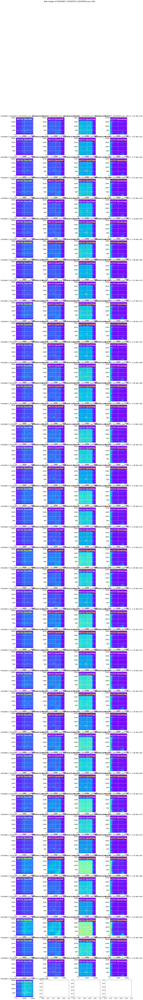

In [40]:
ShowRawImages()

## Show histograms
===========================

In [41]:
def ShowHistograms():
    """
    ShowHistograms
    ==============
    """
    global all_images
    global all_titles
    global object_name


    NBIMAGES=len(all_images)
    MAXIMGROW=int(NBIMAGES/NBIMGPERLROW)+1
    
    f, axarr = plt.subplots(MAXIMGROW,NBIMGPERLROW,figsize=(20,150))
    for index in np.arange(0,NBIMAGES):
        ix=index%NBIMGPERLROW
        iy=index/NBIMGPERLROW
        image_flat=all_images[index].flatten()
        stat_mean=image_flat.mean()
        stat_rms=image_flat.std()
        legtitle='mean={:4.2f} std={:4.2f}'.format(stat_mean,stat_rms)
        axarr[iy,ix].hist(image_flat,bins=100,range=(-50,10000),facecolor='blue', alpha=0.75,label=legtitle);
        axarr[iy,ix].set_yscale('log')
        axarr[iy,ix].grid(True)
        axarr[iy,ix].set_ylim(0.,1e10)
        axarr[iy,ix].set_title(all_titles[index])
        axarr[iy,ix].legend(loc='best')  #useless
    title='histograms of images {}  '.format(object_name)
    plt.suptitle(title,size=16)        

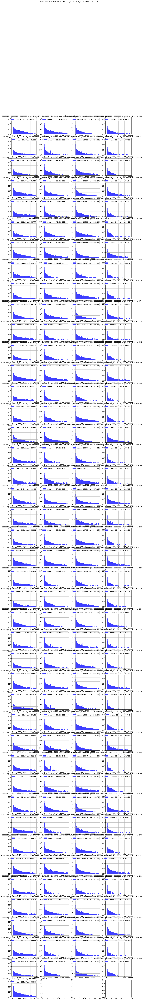

In [42]:
ShowHistograms()